# Classification Model for Wine quality data

In [1]:
library(tidyverse)
library(dplyr)
library(repr)
library(tidymodels)
library(recipes)
install.packages("themis")
library(themis)
install.packages("cowplot")
library(cowplot)

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_co

## Introduction

Wine quality assessment is a crucial aspect of the viticulture and enology industries, influencing production processes, consumer preferences, and market competitiveness. Wine quality is highly dependent on its composition of various aromatic compounds. Understanding the chemical composition of wine and its correlation with quality is essential for winemakers to consistently produce high-quality products. Assessing the content of wines, such as their sugar content and pH value, allows us to determine the quality of the wine. 

Our research question is as follows:
  In this project, we utilize a wine-quality dataset obtained from a web URL. Our primary aim was to develop a classification model capable of accurately predicting wine quality based on key chemical properties. Specifically, we addressed the following question: Can we predict wine quality (low or high) based on attributes such as alcohol content, density, and volatile acidity?

Out of the 12 variables, we select 3 to predict wine quality. In our dataset, wine quality ranges from 0 to 10, but we categorize it into two groups: wines with a quality lower or equal to 5 are classified as Low-quality, while those with a quality higher than 5 are deemed High-quality. Thus, we employ these three predictors to distinguish between low and high-quality wines.

Our focus lies in identifying which attributes influence wine quality and predicting quality based on each attribute's values. Employing classification methods, we develop a classifier to aid in determining wine quality using vital measurements. Our primary interest is in High-quality wines, as we aim to identify them for reproduction and sale purposes.

# Methods & Results

## Preliminary exploratory data analysis

**1. Data Reading**

Scrapping data: We scrapped our dataset off the URL https://archive.ics.uci.edu/static/public/186/wine+quality.zip. We extracted two zip files—each one has data from each type of wine (red and white). We merged them together and labeled them accordingly.

In [2]:
temp <- tempfile()
download_file <- download.file("https://archive.ics.uci.edu/static/public/186/wine+quality.zip", temp)
red_wine <- read.csv2(unz(temp, "winequality-red.csv")) |>
             mutate(type = 0)
white_wine <- read.csv2(unz(temp, "winequality-white.csv")) |>
              mutate(type = 1)
unlink(temp)

**2. Data Wrangling**

Our target column (quality) initially has the type of a number and ranges from 3 to 8. However, to address our question of classifying our data into either high or low quality, we refactor any quality with less and equal to 5 as “Low” and “High” for any rows that have a quality higher  5. We also refactor our target columns to factor type and all the other predictors into numeric values. As the wine type(i.e. white wine or red wine) doesn't effect our wine quality, we delete this column in data wrangling.

In [3]:
wine_data <- rbind(red_wine, white_wine) |>
             mutate(across(fixed.acidity:alcohol, as.numeric), type = as_factor(type), quality = as.factor(quality))

write_csv(wine_data, "../data/wine_data.csv")
head(wine_data)

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality,type
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
1,7.4,0.70,0.00,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0
2,7.8,0.88,0.00,2.6,0.098,25,67,0.9968,3.20,0.68,9.8,5,0
3,7.8,0.76,0.04,2.3,0.092,15,54,0.9970,3.26,0.65,9.8,5,0
4,11.2,0.28,0.56,1.9,0.075,17,60,0.9980,3.16,0.58,9.8,6,0
5,7.4,0.70,0.00,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0
6,7.4,0.66,0.00,1.8,0.075,13,40,0.9978,3.51,0.56,9.4,5,0


In [4]:
wine_data <- wine_data |>
    select(fixed.acidity:quality) |>
    mutate(quality = fct_recode(quality, "Low" = "3",
                                "Low" = "4",
                                "Low" = "5",
                                "High" = "6",
                                "High" = "7",
                                "High" = "8",
                                "High" = "9"))
head(wine_data)

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,7.4,0.70,0.00,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,Low
2,7.8,0.88,0.00,2.6,0.098,25,67,0.9968,3.20,0.68,9.8,Low
3,7.8,0.76,0.04,2.3,0.092,15,54,0.9970,3.26,0.65,9.8,Low
4,11.2,0.28,0.56,1.9,0.075,17,60,0.9980,3.16,0.58,9.8,High
5,7.4,0.70,0.00,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,Low
6,7.4,0.66,0.00,1.8,0.075,13,40,0.9978,3.51,0.56,9.4,Low


**3. Data Splitting**

To gauge the accuracy of our predictions, it's essential to divide our data into training and testing datasets. Fortunately, our dataset is sufficiently large to allow for substantial training and testing sets. Therefore, we've opted to split them in a $0.75$ ratio. 

We exclusively utilize our training dataset for constructing the classifier, reserving the testing set for evaluation purposes. During this stage, it's crucial to set a seed value to maintain the randomness of the data generation process. This ensures that human influence doesn't bias our results and that our randomness remains reproducible. The seed value we've chosen is $1$.

In [5]:
set.seed(1)
wine_unscaled_split <- initial_split(wine_data, prop = 0.75, strata = quality)
wine_unscaled_training <- training(wine_unscaled_split)
wine_unscaled_testing <- testing(wine_unscaled_split)

**4. Summarization**

We performed a series of summarization across the predictors. We find that our dataset has an imbalance in the quality. Low-quality wine has $1788$ rows, while high-quality wine has $3084$ rows. This observation means that we need to balance our data to upsample our target columns. Furthermore, we explored the means of numeric predictors, which are widely varied, and the type has imbalance. Hence, it is necessary to scale and center our predictors if we want to use the classification. After necessary pre-engineering steps, we discovered that the mean alcohol shows the most significant difference among low- and high-quality wine, and density and volatile acidity also have a great difference. So, we choose alcohol, density, and volatile acidity as our predictors.

**a. The number of observations in each Low quality & High quality wine classumber**

In [6]:
wine_type_number <- wine_unscaled_training |>
                    group_by(quality) |>
                    summarize(Number = n())
wine_type_number

quality,Number
<fct>,<int>
Low,1788
High,3084


We've collected 1788 observations for Low-quality wine and 3084 observations for High-quality wine, revealing an imbalance between the two wine types. 

To address this issue, we must balance the data.

**b. The mean value of each measurements for different quality types**

In [7]:
unscaled_mean_measurements <- wine_unscaled_training |>
                     group_by(quality) |>
                     summarize(mean_fixed_acidity = mean(fixed.acidity),
                               mean_volatile_acidity = mean(volatile.acidity),
                               mean_citric_acid = mean(citric.acid),
                               mean_residual_sugar = mean(residual.sugar),
                               mean_chlorides = mean(chlorides),
                               mean_free_sufdioxide = mean(free.sulfur.dioxide),
                               mean_tot_sufdioxide = mean(total.sulfur.dioxide),
                               mean_density = mean(density),
                               mean_ph = mean(pH),
                               mean_sulphates = mean(sulphates),
                               mean_alcohol = mean(alcohol))
unscaled_mean_measurements

quality,mean_fixed_acidity,mean_volatile_acidity,mean_citric_acid,mean_residual_sugar,mean_chlorides,mean_free_sufdioxide,mean_tot_sufdioxide,mean_density,mean_ph,mean_sulphates,mean_alcohol
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Low,7.328915,0.3957774,0.3037081,5.751147,0.06380369,29.97036,121.2293,0.9957534,3.211292,0.5218960,9.876033
High,7.185506,0.3069569,0.3292964,5.336235,0.05172860,30.82377,113.1013,0.9941456,3.218778,0.5385182,10.844488


The ranges of the mean are different across different columns hence the variables will need to be scaled.

**c. Fixing the imbalance of the data, and do centering and scaling**

In [8]:
wine_recipe <- recipe(quality ~ ., wine_unscaled_training) |>
    step_scale(all_predictors()) |>
    step_center(all_predictors()) |>
    step_upsample(quality, over_ratio = 1, skip = FALSE) |>
    prep()
scaled_wine <- bake(wine_recipe, wine_unscaled_training)
head(scaled_wine)

fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
-0.9463883,-0.7940809,-0.5517782,1.3878054,-0.1772969,1.3640597,0.83779953,0.7547371,0.7784090,-0.97036968,-0.9097504,Low
-0.1820231,1.7189580,-0.9661009,-0.8372192,0.1680812,-1.3095373,-1.15547325,0.1214453,-0.8541388,0.46047318,-0.9932850,Low
-0.3348961,0.6156726,-0.8279933,2.2064465,0.2544257,1.6982593,1.22246621,1.3680303,-0.5401873,-0.56155743,-1.5780276,Low
1.0409613,0.1253236,-0.4136707,1.1778974,-0.7529270,0.7235104,0.96019347,0.0214518,-1.1680903,-0.28901594,1.2621505,Low
-1.0992614,-0.1198509,-0.6208320,-0.8372192,-0.6665825,0.4728607,0.08595102,-2.0117484,-1.6076224,-1.24291117,1.2621505,Low
0.8116517,-0.9779618,0.3459209,-0.9001916,-0.2060784,-1.3652373,-0.38613990,-0.3451909,-0.2262358,-0.08460981,-0.3250078,Low


**d. The Observation Number of each quality type after balancing**

In [9]:
balanced_num <- scaled_wine |>
    group_by(quality) |>
    summarize(number = n())
balanced_num

quality,number
<fct>,<int>
Low,3084
High,3084


Now the number of observations for both Low quality wine and High quality wine are both 3084.

**e. Mean value of each measurements for different quality type after scaling and centering**

In [10]:
mean_measurements <- scaled_wine |>
                     group_by(quality) |>
                     summarize(mean_fixed_acidity = mean(fixed.acidity),
                               mean_volatile_acidity = mean(volatile.acidity),
                               mean_citric_acid = mean(citric.acid),
                               mean_residual_sugar = mean(residual.sugar),
                               mean_chlorides = mean(chlorides),
                               mean_free_sufdioxide = mean(free.sulfur.dioxide),
                               mean_tot_sufdioxide = mean(total.sulfur.dioxide),
                               mean_density = mean(density),
                               mean_ph = mean(pH),
                               mean_sulphates = mean(sulphates),
                               mean_alcohol = mean(alcohol))
mean_measurements

quality,mean_fixed_acidity,mean_volatile_acidity,mean_citric_acid,mean_residual_sugar,mean_chlorides,mean_free_sufdioxide,mean_tot_sufdioxide,mean_density,mean_ph,mean_sulphates,mean_alcohol
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Low,0.07937048,0.3922112,-0.09963720,0.05933768,0.2900199,-0.04249919,0.07225059,0.3740373,-0.006082932,-0.03730831,-0.5251452
High,-0.04022889,-0.1997970,0.06484692,-0.03196276,-0.1275452,0.01744507,-0.05215604,-0.1966754,0.017249651,0.04156435,0.2968973


Following scaling and centering, we can identify the variables we'll select as predictors. Upon reviewing the data frame, it's evident that mean alcohol exhibits the most significant difference between low and high-quality wine. Additionally, density and volatile acidity also display notable discrepancies.

Therefore, we opt to use Alcohol, density, and volatile acidity as our predictors.

**f. Missing data - We have no missing data in this dataset.**

**5. Visualization: histogram between quality and other numeric variables**

To confirm our expectations that alcohol, density, and volatile acidity are the determining predictors among all the others, we visualize their distributions through a histogram and use color coding to separate low- and high-quality wine. We find that the distributions of alcohol, density, and volatile acidity are separated the when compared between high and low quality.

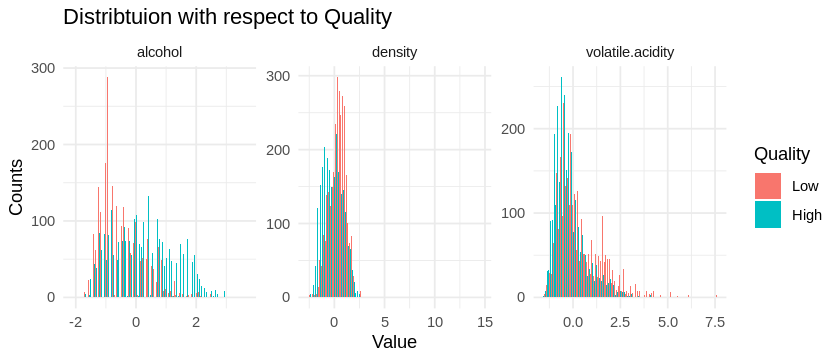

In [11]:
options(repr.plot.width = 7, repr.plot.height = 3) 

#Gather data for facetting
visualization_data <- scaled_wine |>
  gather(key = "variable", value = "value", c("alcohol", "density", "volatile.acidity"))

# Create facetted histograms
facet_histograms <- ggplot(visualization_data, aes(x = value, fill = quality)) +
  geom_histogram(position = "dodge", bins = 100) +
  labs(title = "Distribtuion with respect to Quality", x = "Value", y = "Counts", fill = "Quality") +
  facet_wrap(~variable, scales = "free") +
  theme_minimal()

# Display facetted histograms
print(facet_histograms)

**6. Choosing predictors**

We choose the predictors based on the mean value difference and our visualization, which is density, volatile acidity, and alcohol.

## Training & Evaluation

###  Classification Model

Before our model training, we first set the seed value to $1$. As we only use 3 variables to predict the quality, we create a new data frame "wine_cl" for classification.

To train our classification model effectively, we begin by splitting the data into a training set, utilized for constructing the classifier, and a testing set, employed for evaluating its performance. Initially, we create a recipe and model specification which we experiment with a parameter value K = 10 to assess accuracy. However, aiming for a more refined classifier, we employ cross-validation to fine-tune its parameters.

In our 10-fold cross-validation process, facilitated by the "vfold_cv" function, we divide the training data into $10$ chunks, iteratively designating one as the validation set while employing the remaining 9 for training. Subsequently, we formulate a recipe specifying the class label, predictors, and preprocessing steps for all variables, passing the training data as the "data" argument of the recipe.

Next, we create a nearest_neighbors model specification, leveraging the tune() function to optimize our classifier. Integrating the recipe and model specification into a workflow(), we utilize the tune_grid function on the train/validation splits to estimate classifier accuracy across a range of K values.

Following this step, we generate a visualization plot illustrating the relationship between K values and accuracy, selecting a K value that yields a high-accuracy estimate with minimal fluctuations across nearby values. The best K value we got is K = 91.

Subsequently, we instantiate a new model specification for the optimal parameter K value and retrain the classifier using the fit function. The final accuracy we got for our classification model is 0.76.

To evaluate our classifier's efficacy, we assess its estimated accuracy on the test set using the predict function. Additionally, we construct a confusion matrix and compute the precision and recall values to further evaluate our classification.  we strongly emphasize accuracy and precision. Because we want this model to act as a recommendation system, predicting more true values is essential. For our classification model, we achieve an accuracy of 0.76, a precision we got is 0.86 and a recall we got is 0.78.

In [12]:
set.seed(1)

In [13]:
wine_cl <- wine_data |>
    select(alcohol, density, volatile.acidity, quality)
head(wine_cl)

,alcohol,density,volatile.acidity,quality
,<dbl>,<dbl>,<dbl>,<fct>
1,9.4,0.9978,0.70,Low
2,9.8,0.9968,0.88,Low
3,9.8,0.9970,0.76,Low
4,9.8,0.9980,0.28,High
5,9.4,0.9978,0.70,Low
6,9.4,0.9978,0.66,Low


In [14]:
wine_split <- initial_split(wine_cl, prop = 0.75, strata = quality)
wine_train <- training(wine_split)
wine_test <- testing(wine_split)

In [15]:
wine_recipe <- recipe(quality ~ ., data = wine_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors()) |>
  step_upsample(quality, over_ratio = 1, skip = FALSE)

knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 10) |>
  set_engine("kknn") |>
  set_mode("classification")

knn_fit <- workflow() |>
  add_recipe(wine_recipe) |>
  add_model(knn_spec) |>
  fit(data = wine_train)

knn_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
3 Recipe Steps

• step_scale()
• step_center()
• step_upsample()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(10,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.2516213
Best kernel: rectangular
Best k: 10

- Then we use cross-validation to select the best K value.

In [16]:
wine_split <- initial_split(wine_train, prop = 0.75, strata = quality)
wine_subtrain <- training(wine_split)
wine_validation <- testing(wine_split)

# recreate the standardization recipe from before
knn_recipe <- recipe(quality ~ ., data = wine_subtrain) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())


In [17]:
wine_vfold <- vfold_cv(wine_train, v = 10, strata = quality)

vfold_metrics <- workflow() |>
                  add_recipe(knn_recipe) |>
                  add_model(knn_spec) |>
                  fit_resamples(resamples = wine_vfold) |>
                  collect_metrics()

vfold_metrics

.metric,.estimator,mean,n,std_err,.config
<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
accuracy,binary,0.7304814,10,0.006720340,Preprocessor1_Model1
roc_auc,binary,0.7765029,10,0.005387728,Preprocessor1_Model1


- We use 10 folds for cross-validation, and the mean accuracy here is 0.73.

In [18]:
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
            set_engine("kknn") |>
            set_mode("classification")
knn_recipe <- recipe(quality ~., data = wine_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

In [19]:
k_vals <- tibble(neighbors = seq(from = 1, to = 100, by = 5))

knn_results <- workflow() |>
  add_recipe(knn_recipe) |>
  add_model(knn_spec) |>
  tune_grid(resamples = wine_vfold, grid = k_vals) |>
  collect_metrics()

accuracies <- knn_results |>
  filter(.metric == "accuracy")

accuracies

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.7417805,10,0.006482763,Preprocessor1_Model01
6,accuracy,binary,0.7204438,10,0.006053231,Preprocessor1_Model02
11,accuracy,binary,0.7272116,10,0.004546666,Preprocessor1_Model03
16,accuracy,binary,0.7384892,10,0.004750653,Preprocessor1_Model04
21,accuracy,binary,0.7419783,10,0.005556768,Preprocessor1_Model05
26,accuracy,binary,0.7395176,10,0.005673755,Preprocessor1_Model06
31,accuracy,binary,0.7413589,10,0.005847777,Preprocessor1_Model07
36,accuracy,binary,0.7442286,10,0.007192893,Preprocessor1_Model08
41,accuracy,binary,0.7446384,10,0.007636126,Preprocessor1_Model09


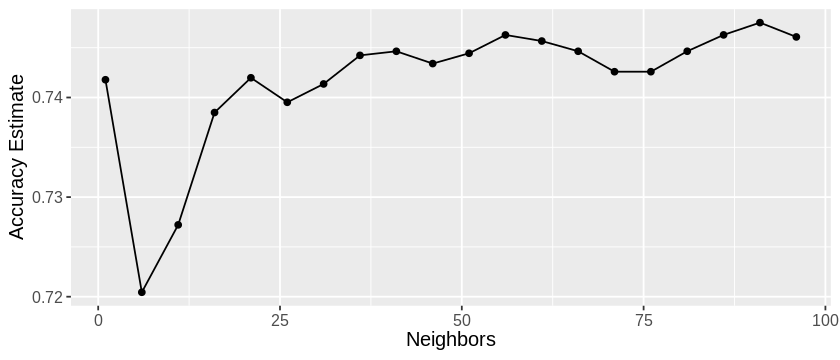

In [20]:
accuracy_vs_k <- ggplot(accuracies, aes(x = neighbors, y = mean)) +
  geom_point() +
  geom_line() +
  labs(x = "Neighbors", y = "Accuracy Estimate") +
  theme(text = element_text(size = 12))

accuracy_vs_k

In [21]:
best_k <- accuracies |>
        arrange(desc(mean)) |>
        head(1) |>
        pull(neighbors)
best_k

[1] 91

In [22]:
knn_recipe_final <- recipe(quality ~., data = wine_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

knn_spec_final <- nearest_neighbor(weight_func = "rectangular", neighbors = best_k) |>
  set_engine("kknn") |>
  set_mode("classification")

knn_fit <- workflow() |>
  add_recipe(knn_recipe_final) |>
  add_model(knn_spec_final) |>
  fit(data = wine_train)

knn_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(91,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.2541051
Best kernel: rectangular
Best k: 91

In [23]:
knn_pred <- predict(knn_fit, wine_test) |>
  bind_cols(wine_test)

knn_pred |>
  metrics(truth = quality, estimate = .pred_class) |>
  filter(.metric == "accuracy")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.7575385


The accuracy observed in this classification model is 0.76.

In [24]:
confusion <- knn_pred |>
             conf_mat(truth = quality, estimate = .pred_class)
confusion

          Truth
Prediction Low High
      Low  345  143
      High 251  886

- Our confusion Matrix is shown above.

- As we need to select High-quality wine and use their variables to adjust our produce method to get more high-quality wine, we need to focus on(more interested in) High-quality wines. Here the positive class(High quality) is in the second level.

In [25]:
recall_score <- knn_pred |>
  recall(truth = quality, estimate = .pred_class, event_level = "second")
recall_score

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
recall,binary,0.8610301


In [26]:
precision_score <- knn_pred |>
  precision(truth = quality, estimate = .pred_class, event_level = "second")
precision_score

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
precision,binary,0.7792436


- The recall we got is 0.86, and the precision we got is 0.78.

### Visualize the result

In [27]:
wkflw_plot_1 <-
  ggplot() +
  geom_point(data = wine_data,
             mapping = aes(x = alcohol,
                           y = volatile.acidity,
                           color = quality),
             alpha = 0.75) +
   geom_point(data = knn_pred,
             mapping = aes(x = alcohol,
                           y = volatile.acidity,
                           color = quality),
             alpha = 0.05,
             size = 2) +
  labs(color = "quality",
       x = "density",
       y = "volatile.acidity") +
  scale_color_manual(values = c("darkorange", "steelblue")) +
  theme(text = element_text(size = 12))

In [28]:
wkflw_plot_2 <-
  ggplot() +
  geom_point(data = wine_data,
             mapping = aes(x = alcohol,
                           y = density,
                           color = quality),
             alpha = 0.75) +
   geom_point(data = knn_pred,
             mapping = aes(x = alcohol,
                           y = density,
                           color = quality),
             alpha = 0.05,
             size = 2) +
  labs(color = "quality",
       x = "alcohol",
       y = "density") +
  scale_color_manual(values = c("darkorange", "steelblue")) +
  theme(text = element_text(size = 12))

In [29]:
wkflw_plot_3 <-
  ggplot() +
  geom_point(data = wine_data,
             mapping = aes(x = volatile.acidity,
                           y = density,
                           color = quality),
             alpha = 0.75) +
   geom_point(data = knn_pred,
             mapping = aes(x = volatile.acidity,
                           y = density,
                           color = quality),
             alpha = 0.05,
             size = 2) +
  labs(color = "quality",
       x = "volatile.acidity",
       y = "density") +
  scale_color_manual(values = c("darkorange", "steelblue")) +
  theme(text = element_text(size = 12))

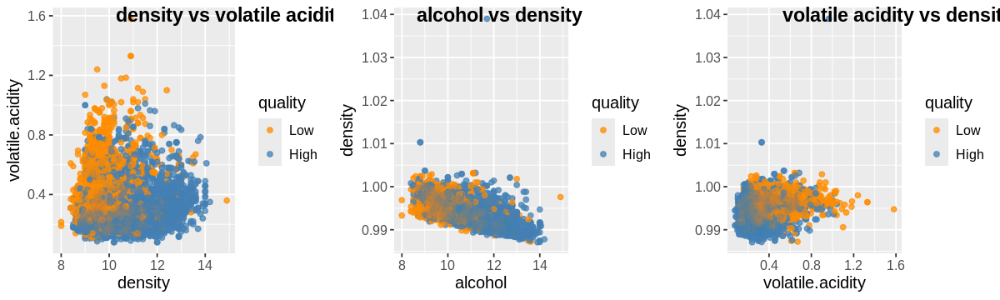

In [30]:
options(repr.plot.width = 10, repr.plot.height = 3) 
combined_plot <- plot_grid(wkflw_plot_1, wkflw_plot_2, wkflw_plot_3,
                           labels = c("density vs volatile acidity", "alcohol vs density", "volatile acidity vs density"),
                           ncol = 3, align = "h") +
                 theme(text = element_text(size = 8))           

print(combined_plot)

While the accuracy and precision scores are high, we notice that the model could be more accurate when predicting high quality, which has more data points. We visualize our result through three scatterplots where the x-axis and y-axis are the predictors. The values are color-coded according to their quality. 

## Discussion

The accuracy observed in this classification model is 0.76. The recall we got is 0.86, and the precision we got is 0.78.  And We see through the visualization that model doesn't have a clear border between low and high prediction. This can mean that our model still picks up quirks. However, the color is not too blended between low and high, meaning our model is relatively accurate.

Upon conducting our classification analysis, several key findings have emerged.
Our investigation revealed that mean alcohol content, density, and volatile acidity were significant predictors of wine quality. We fine-tuned our classifier using cross-validation and identified an optimal K value that maximized accuracy while minimizing fluctuations.

This outcome aligns with our expectations to some extent. We anticipated that certain chemical properties, such as alcohol content and volatile acidity levels, would strongly influence wine quality. 

Explicitly, we find that alcohol was a driving factor when we trained our model. This can be explained that there is imbalance toward red wine in our dataset. Although with the balancing step, due to that alcohol concentrative is strongly influential in the perception of taste and smell of red wine, alcohol is a strong predictor (Newsom, 2024). 

The implications of these findings are substantial. By accurately predicting wine quality based on chemical attributes, winemakers can streamline production processes and ensure consistency in product quality. Additionally, consumers can make more informed purchasing decisions, leading to improved market transparency and customer satisfaction.

Looking ahead, these findings raise several intriguing questions for future research. For instance, what additional variables could further enhance the accuracy of our classifier? Are there regional or varietal differences in the importance of certain predictors? Furthermore, how do environmental factors, such as climate and soil composition, interact with chemical properties to influence wine quality?

Exploring these avenues could deepen our understanding of wine production and quality assessment, potentially leading to innovations in viticulture and enology. Ultimately, such research endeavors have the potential to benefit both producers and consumers within the wine industry.

### Alternative approach to improve classification: Generalized Linear Regression 

Initially, we chose linear regression approach because we are also interested in the ordering of our target variable: low and high. We encoded the quality into 0 and 1. We chose the same amount of variables for the linear regression. The result was significantly less accurate to our classifcation. The accuracy we achieved was 0.69%. This is due to that with ordinal dependent variable, the x and y relationship are not linear (BMI, 2024). Hence, when combining adjacent predictors, linear regression model is relatively sensitive while the effects in an accurate ordinal classification is small (BMI, 2024). 

One alternative approach for this is to use a generalized linear regression: this model fit a separate equation for each levels of the ordinal target variables (BMI, 2024; Newsom, 2024). And then it gives probability of being in the corresponding level or any lower ones. However, due to insufficient statistical training, we chose not to approach this model. However, in the future with a more robust knowledge, we think we can improve our prediction further with this approach.

## References

BMI. (2024). Ordinal regression. IBM SPSS Statistics documentation. https://www.ibm.com/docs/en/spss-statistics/saas?     
      topic=edition-ordinal-regression

King, E. S., Dunn, R. L., & Heymann, H. (2013). The influence of alcohol on the sensory perception of red wines. Food Quality       and Preference, 28(1), 235-243. https://doi.org/10.1016/j.foodqual.2012.08.013

Newsom. (2024). Psy 522/622 Multiple Regression and Multivariate Quantitative Methods. Lecture notes distributed in Winter 2024. https://web.pdx.edu/~newsomj/mvclass/ho_ordinal.pdf